In [7]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import networkx as nx
from collections import Counter
from itertools import combinations

In [29]:
data = 'scraped_data/tags_1e5_posts.json'
df = pd.read_json(data)

In [3]:
df

,name,postCount,relatedTags
0,wellness,33299,"{'health': 326233, 'mental-health': 158176, 'f..."
1,food,155101,"{'health': 326233, 'recipe': 29287, 'cooking':..."
2,life-lessons,397205,"{'life': 446888, 'self-improvement': 272560, '..."
3,humor,124352,"{'satire': 36460, 'life': 446888, 'comedy': 52..."
4,self,71141,"{'self-improvement': 272560, 'life-lessons': 3..."
...,...,...,...
503,happiness,54982,"{'life': 446888, 'life-lessons': 397205, 'self..."
504,wisdom,19519,"{'life-lessons': 397205, 'life': 446888, 'self..."
505,fitness,75733,"{'health': 326233, 'exercise': 18148, 'weight-..."
506,mental-health,158176,"{'life-lessons': 397205, 'life': 446888, 'depr..."


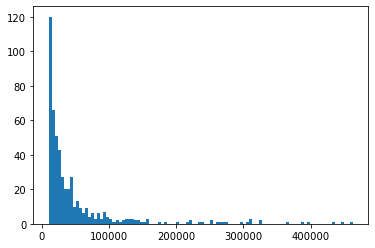

In [4]:
plt.hist(df['postCount'].values, bins = 100)
# plt.semilogy()
plt.show()

In [5]:
top_tags = df.sort_values(by='postCount', ascending = False).head(50)
# top_tags = tag_df[tag_df['postCount']>1e4].sort_values(by='postCount', ascending = False).head(50)
top_tags

,name,postCount,relatedTags
418,startup,462800,"{'entrepreneurship': 311364, 'business': 25228..."
475,life,446888,"{'life-lessons': 397205, 'self-improvement': 2..."
417,blockchain,434421,"{'cryptocurrency': 265822, 'bitcoin': 235042, ..."
2,life-lessons,397205,"{'life': 446888, 'self-improvement': 272560, '..."
6,poetry,387491,"{'love': 309848, 'life': 446888, 'poem': 82448..."
466,politics,364292,"{'donald-trump': 74269, '2016-election': 53358..."
482,travel,326952,"{'life': 446888, 'photography': 133657, 'life-..."
507,health,326233,"{'fitness': 75733, 'life': 446888, 'food': 155..."
379,seo,311862,"{'ppc-marketing': 100492, 'digital-marketing':..."
472,entrepreneurship,311364,"{'startup': 462800, 'business': 252285, 'marke..."


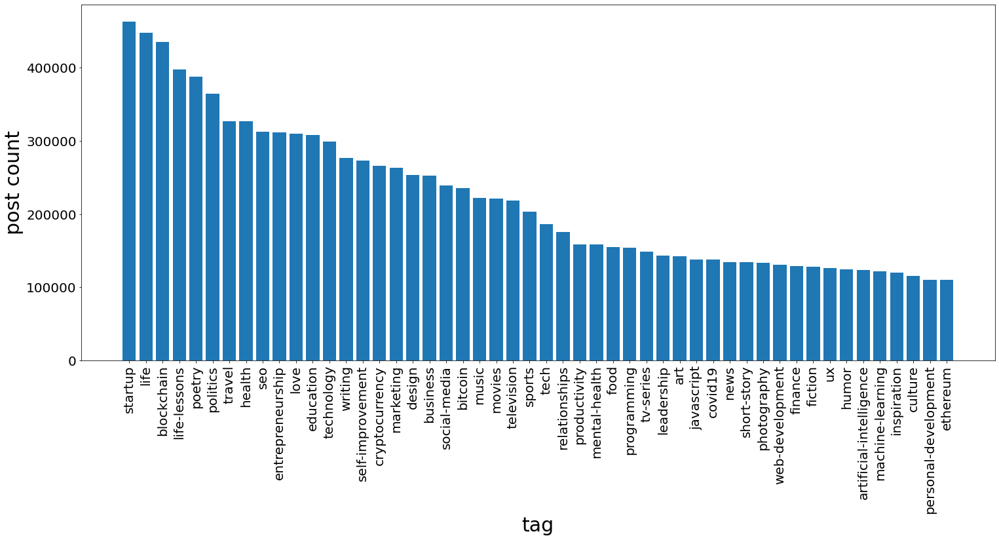

In [6]:
plt.figure(figsize=[25,10])

plt.bar(top_tags['name'],top_tags['postCount'])
plt.xticks(rotation='vertical', fontsize=20)
plt.yticks(fontsize=20)

plt.xlabel('tag',fontsize=30)
plt.ylabel('post count',fontsize=30)
plt.show()

## network graphs

In [19]:
 def append_neighbors_to_df(full_df, top_tags_df):
    
    #dictionary of all related tags
    related_tags = {}
    for dic in top_tags_df['relatedTags']:
        related_tags.update(dic)

    for key in related_tags.keys():
        if key not in top_tags_df['name'].values:
            df_entry = full_df[full_df['name'] == key]
            top_tags_df = top_tags_df.append(df_entry)
            
    return top_tags_df

def add_to_graph(graph, top_tags_df ):
    
    for _, tag in top_tags_df.iterrows():

        graph.add_node(tag['name'], size = tag['postCount']/10)


        combination_of_nodes = [(tag['name'],related_tag) for related_tag in tag['relatedTags']]

        for edge in combination_of_nodes:

            if edge in graph.edges:
                pass
            else:
                if edge[1] not in graph.nodes.data() and edge[1] not in top_tags_df['name'].values :
                    graph.add_node(edge[1], size=tag['relatedTags'][edge[1]]/10)
                graph.add_edge(*edge)
    return graph
                
    
def visualize_network(dataframe, starting_tags, second_degree=False, third_degree = False, title=None):
    
    top_tags_df = dataframe[dataframe['name'].isin(starting_tags)]
    
    G = nx.Graph()
    sizes = []
    
    if second_degree:
        top_tags_df = append_neighbors_to_df(dataframe, top_tags_df)
        if third_degree:
            top_tags_df = append_neighbors_to_df(dataframe, top_tags_df)

                
    G = add_to_graph(G, top_tags_df)
                
    plt.figure(figsize=[50,50])
    if title:
#         plt.title('Top {0} Tags and their direct neighbors'.format(top_n),fontsize=75)
        plt.title(title)
    
    nx.draw_kamada_kawai(G,
            with_labels=True,
            font_weight='bold',
            font_size=35,
            node_size=[node[1] for node in G.nodes.data('size')],
            weight='frequency')
    return G
def top_n_tags(dataframe, n):
    
    return dataframe.sort_values(by='postCount', ascending = False).head(n)['name'].values

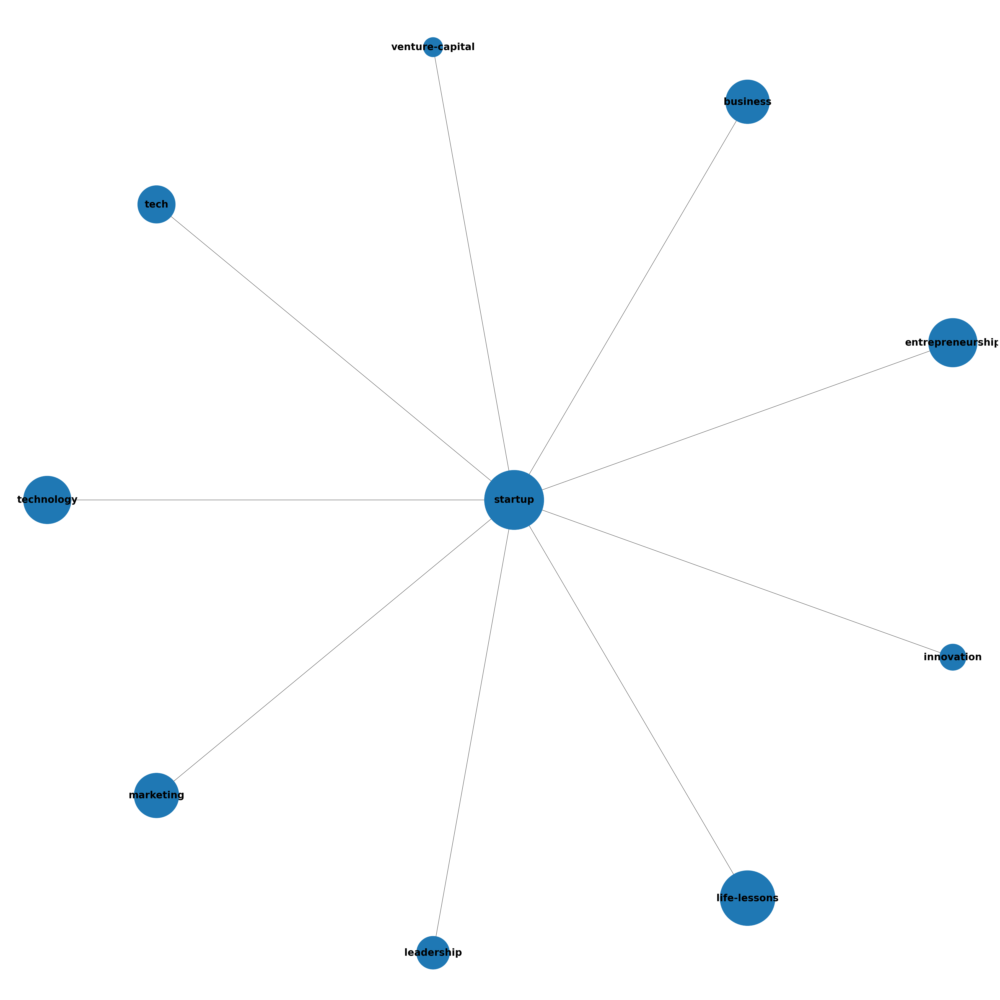

In [10]:
visualize_network(df, ['startup'])

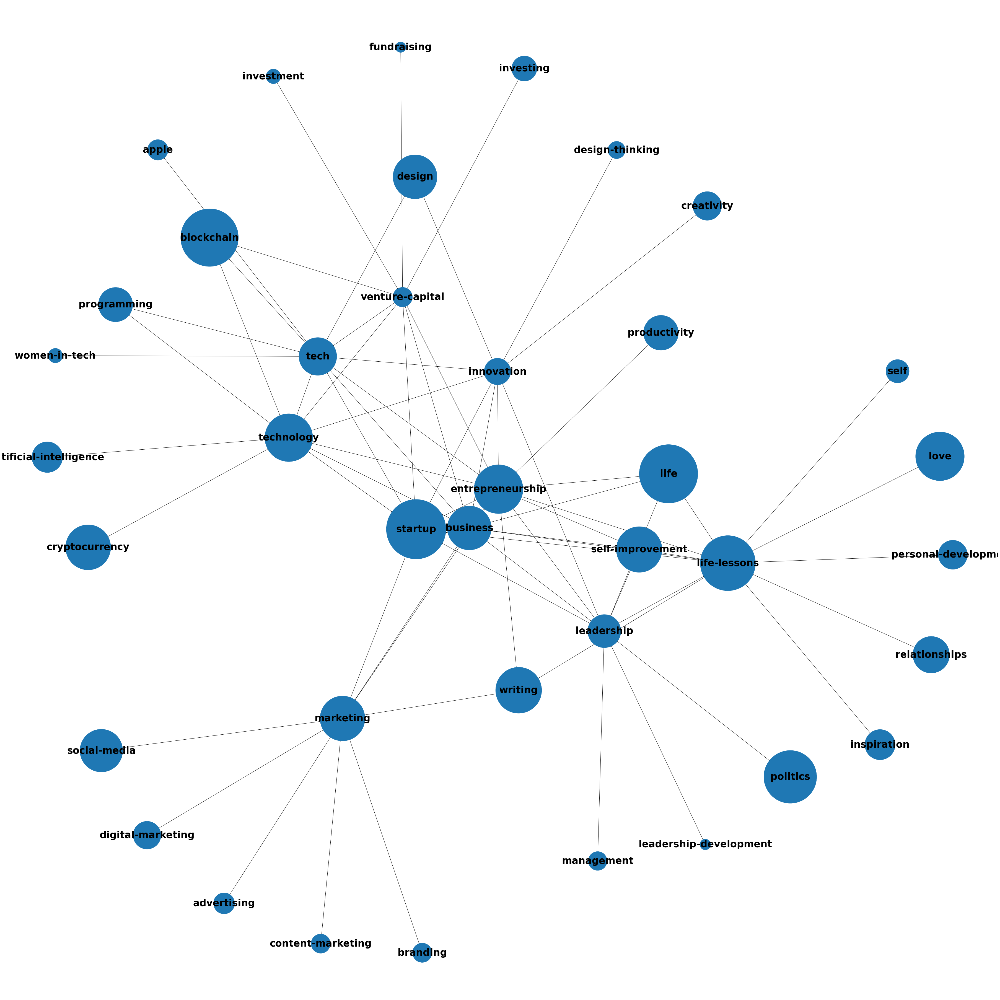

In [11]:
visualize_network(df, ['startup'], second_degree=True)

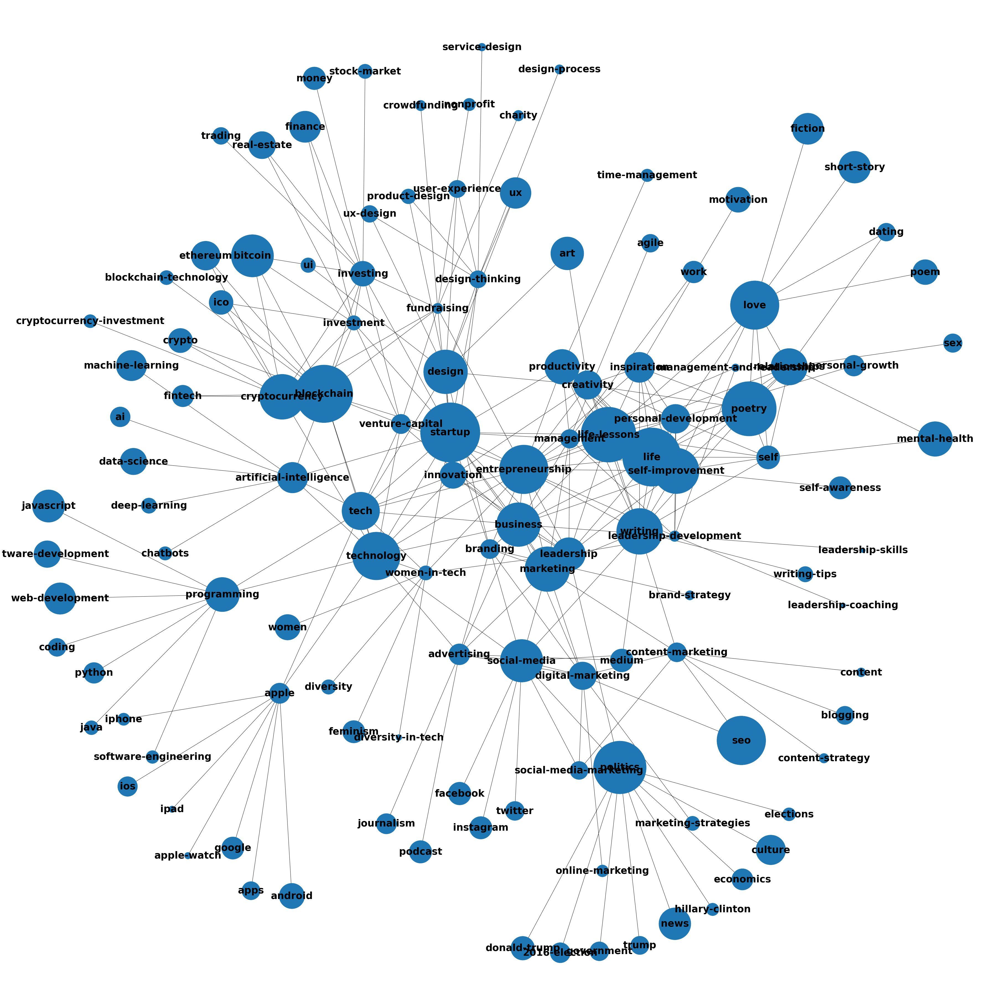

In [12]:
visualize_network(df, ['startup'], second_degree=True, third_degree=True)

network grows really quickly! exponentially ofcourse since each tag has of order ~5 related tags

## Top tags 

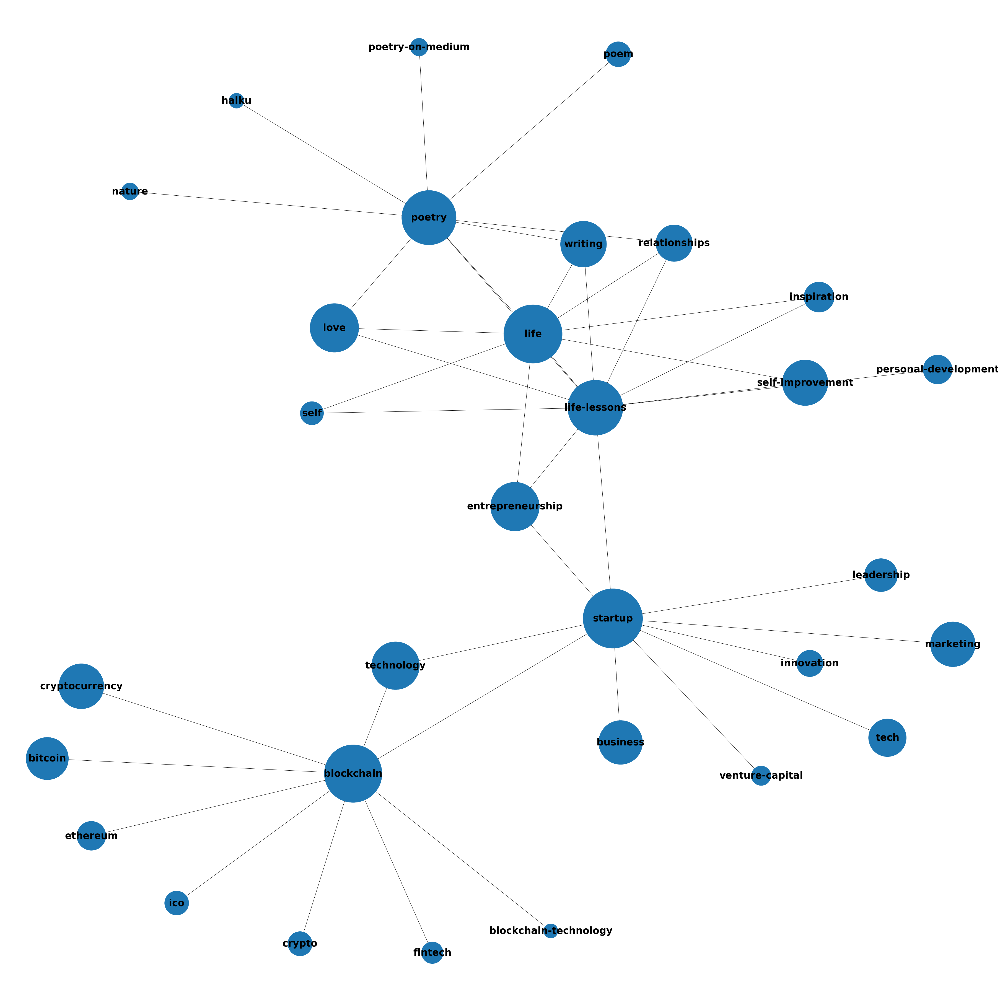

In [20]:
visualize_network(df, top_n_tags(df, 5))

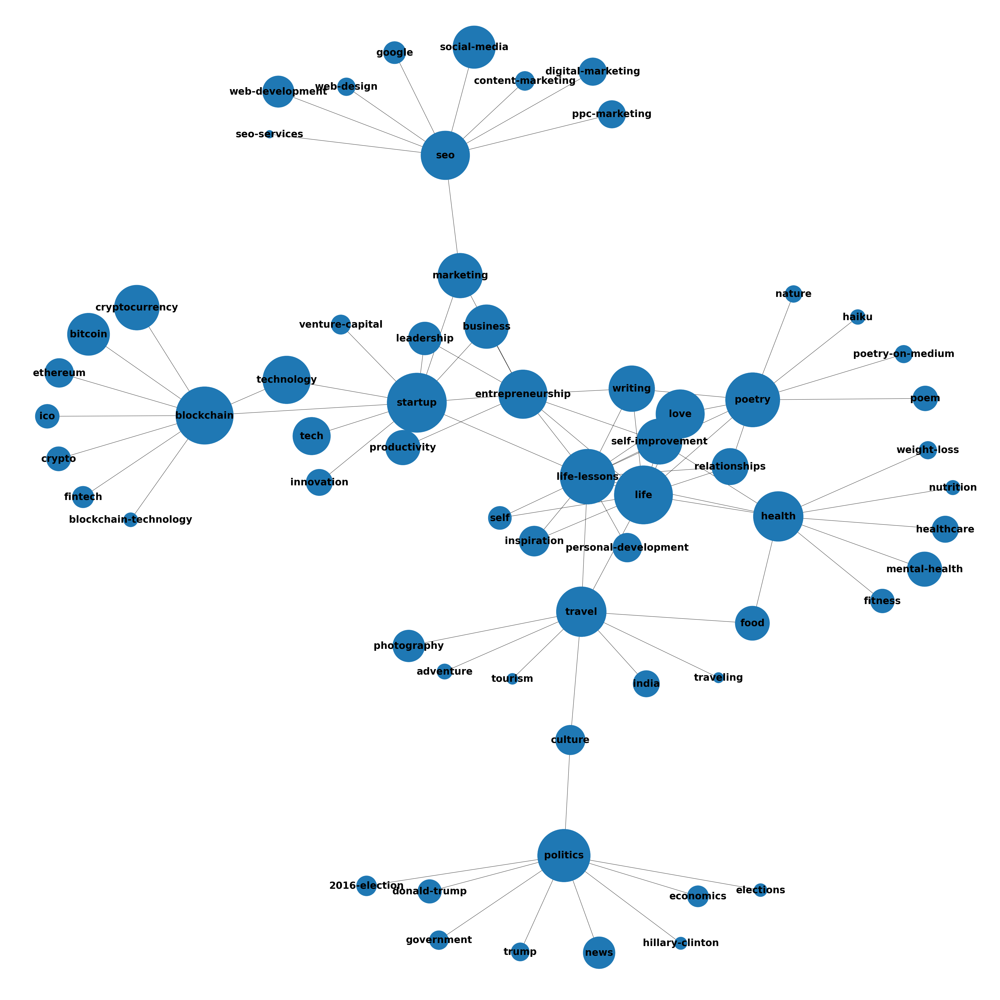

In [21]:
visualize_network(df, top_n_tags(df, 10))

## Connections between tags 

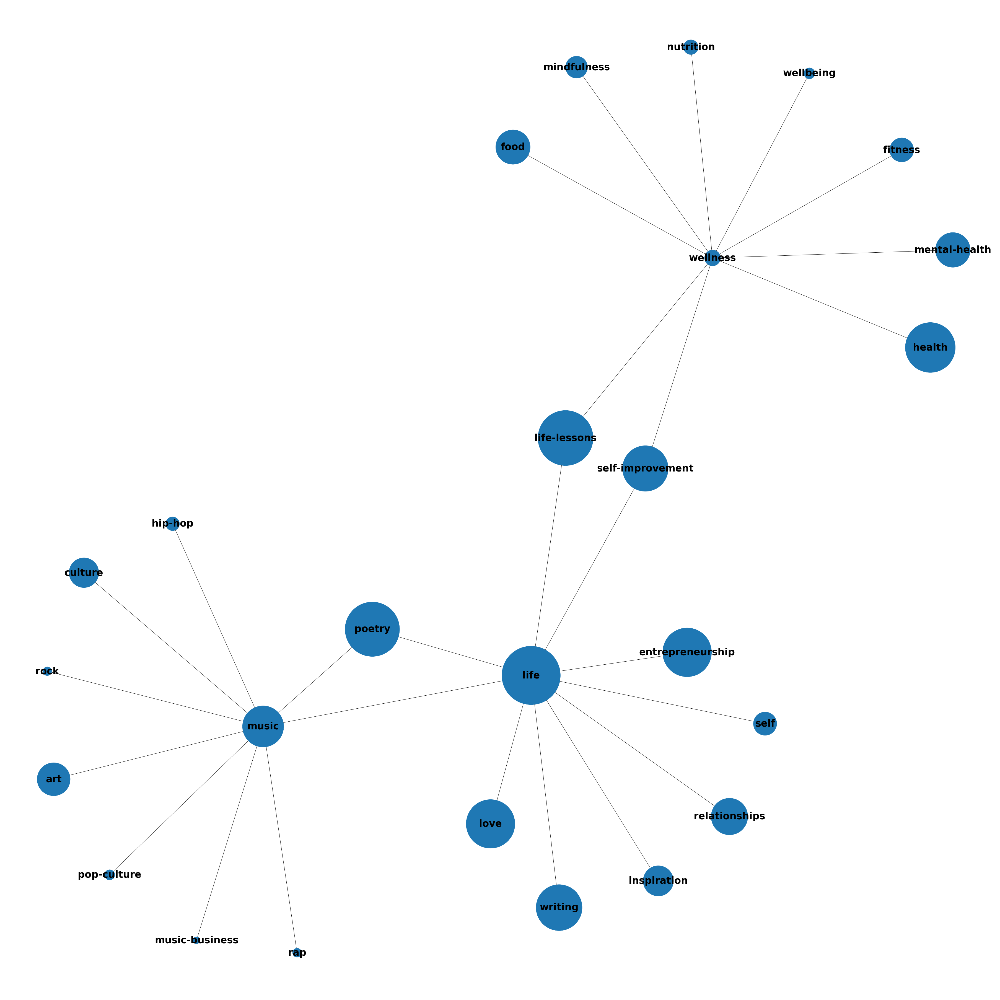

In [13]:
visualize_network(df, ['music', 'wellness', 'life'])

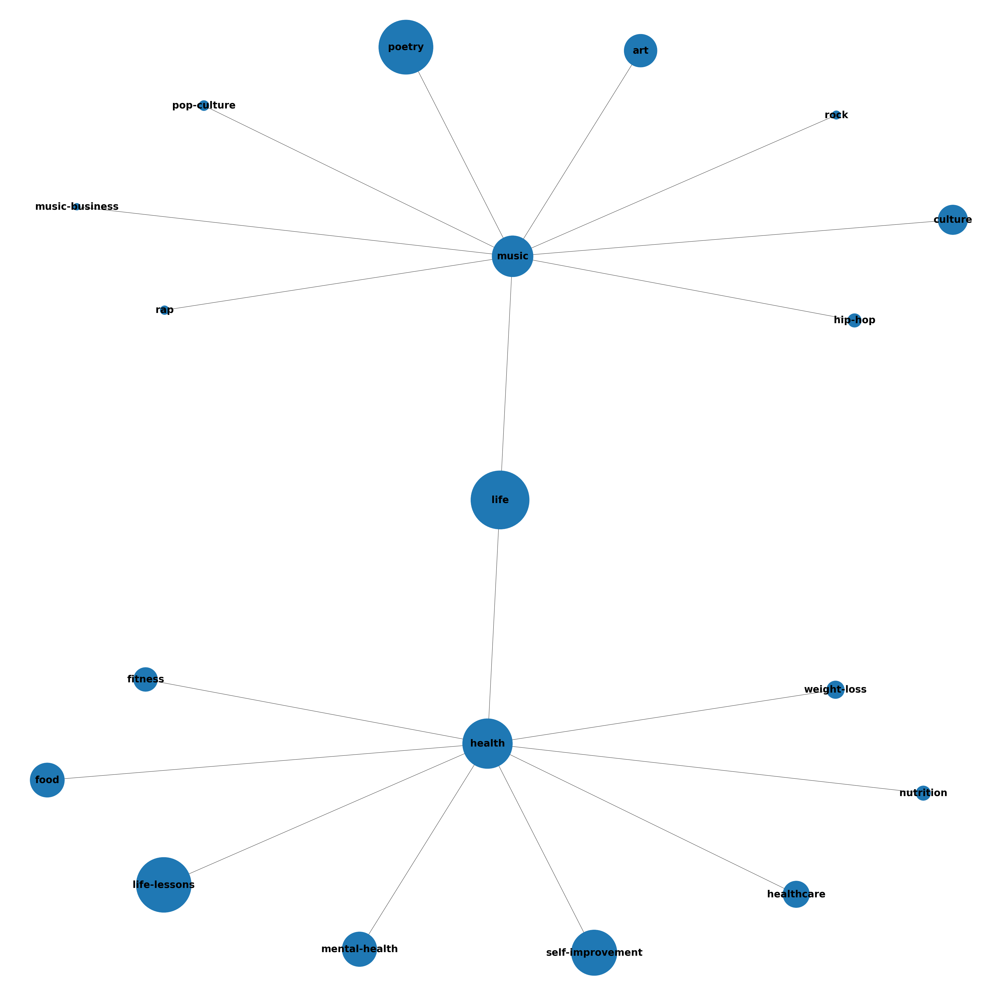

In [22]:
visualize_network(df, ['music', 'health'])

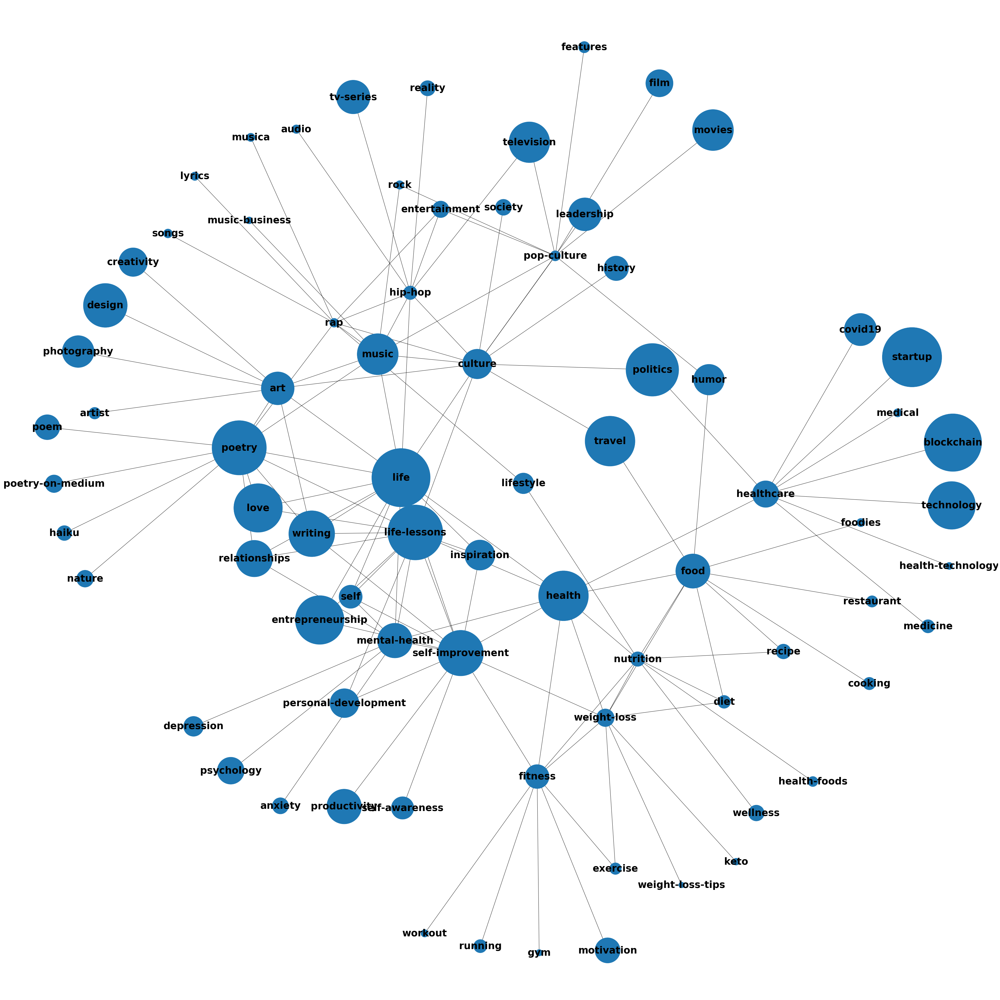

In [23]:
visualize_network(df, ['music', 'health'], second_degree=True)

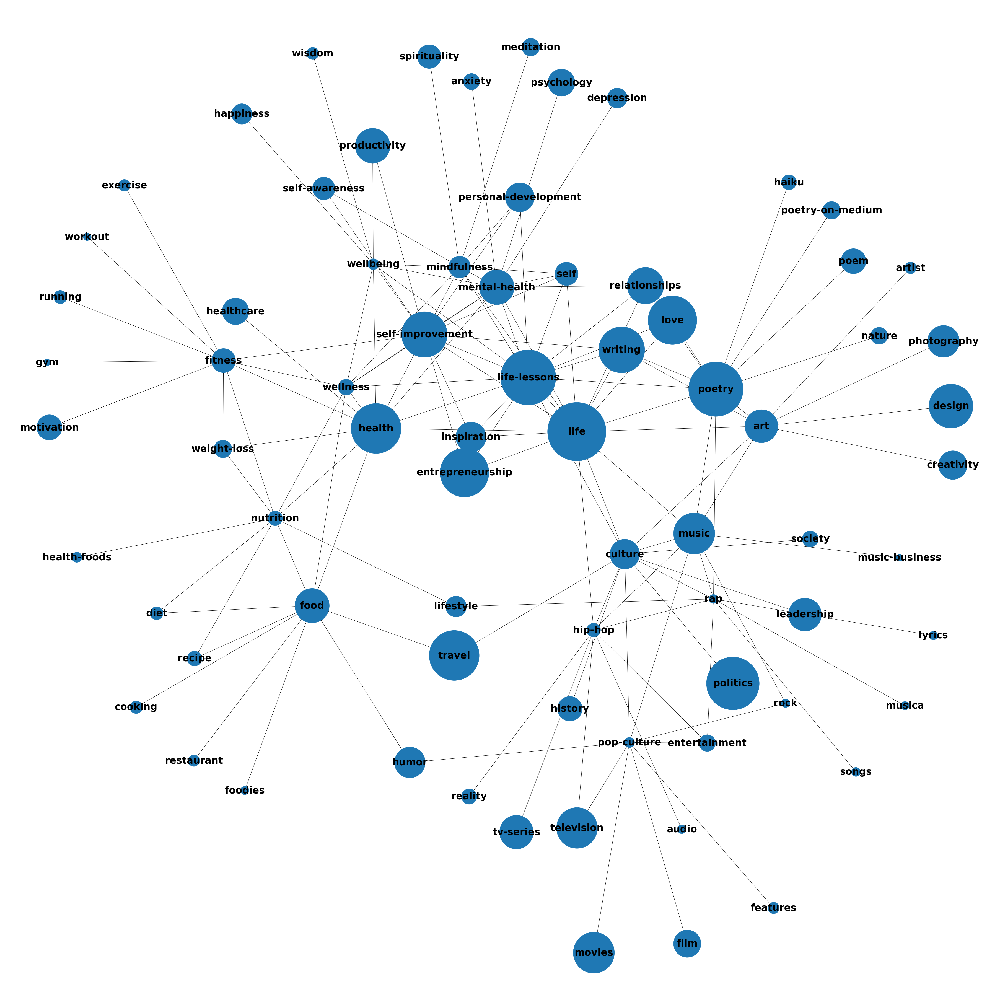

In [24]:
visualize_network(df, ['music', 'wellness'], second_degree=True)

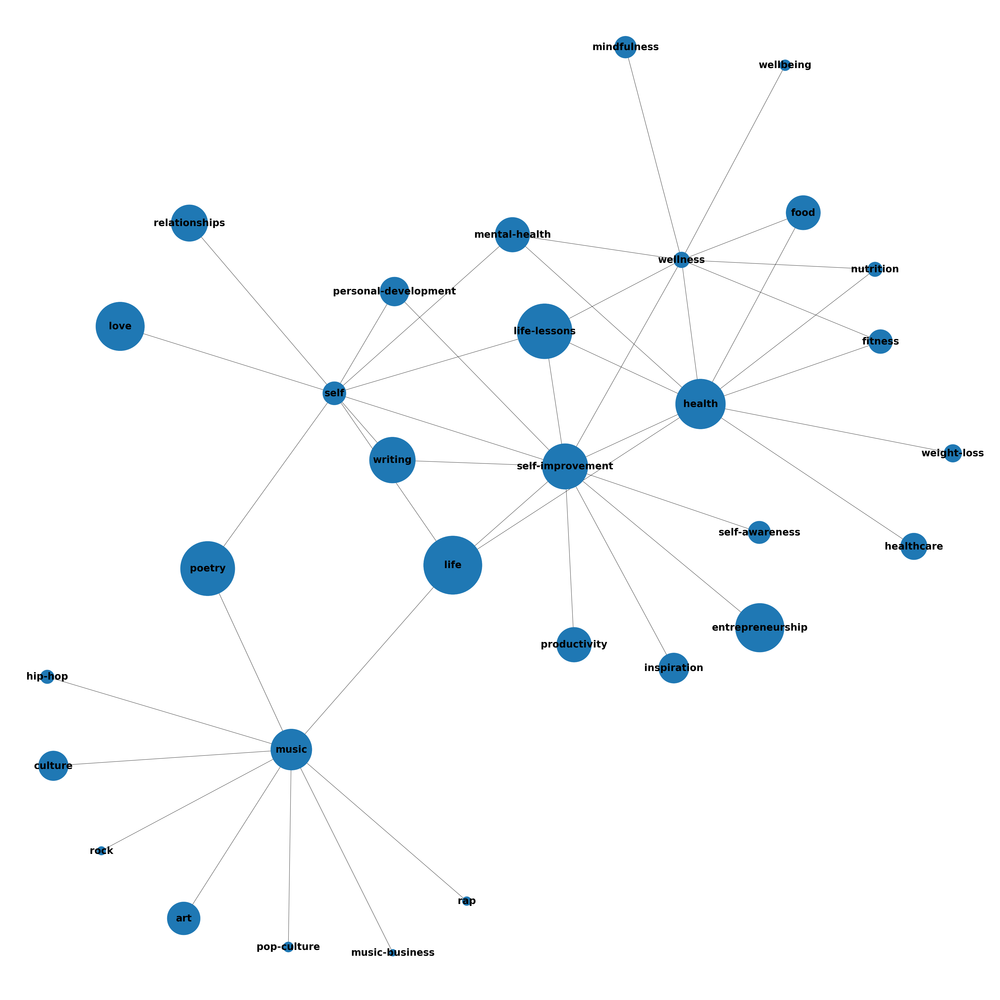

In [28]:
visualize_network(df, ['music', 'health', 'wellness', 'self', 'self-improvement'])

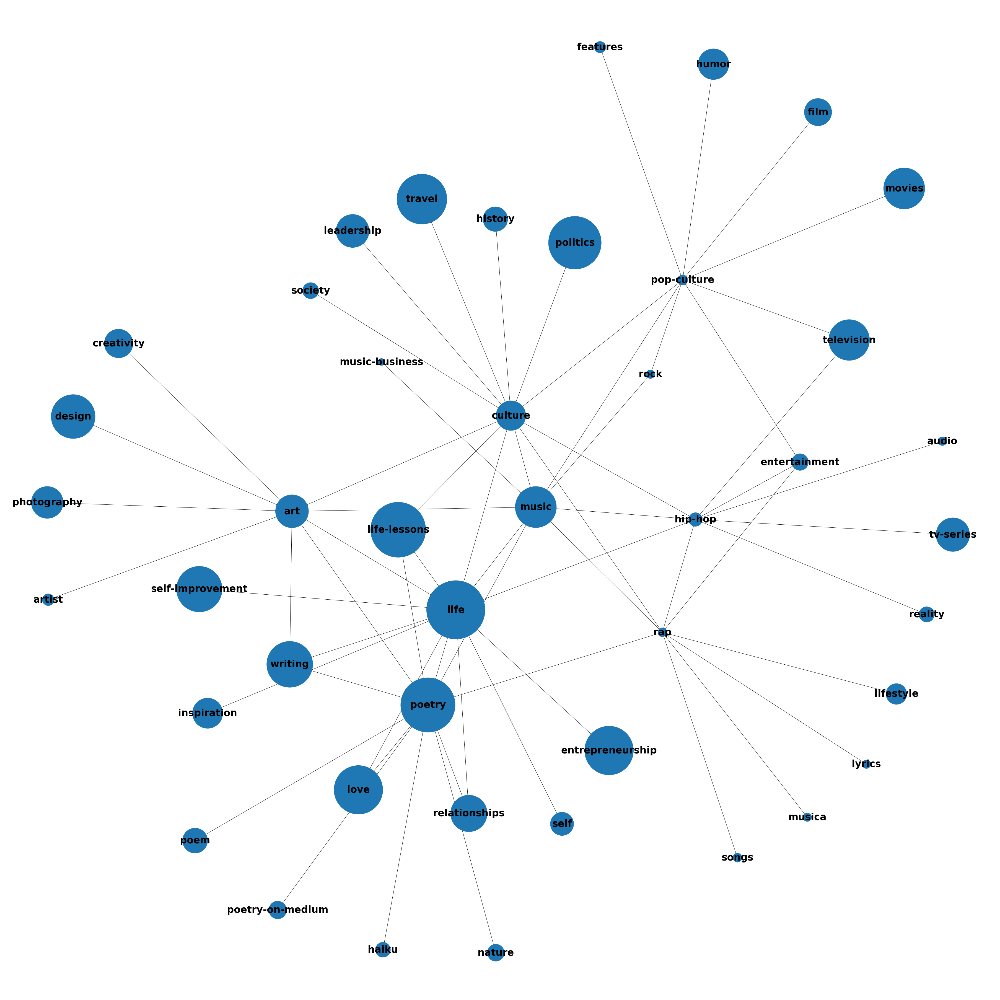

In [26]:
visualize_network(df, ['music'], second_degree=True)

### Things to think about
- related tags are not bidirectional. i.e. health may be an associate tag for wellness, but wellness might not be for health because wellness is not among the top tags